In [1]:
import cv2
import argparse
import cv2
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import imageio
import imutils
cv2.ocl.setUseOpenCL(False)

import features 
# https://towardsdatascience.com/image-panorama-stitching-with-opencv-2402bde6b46c

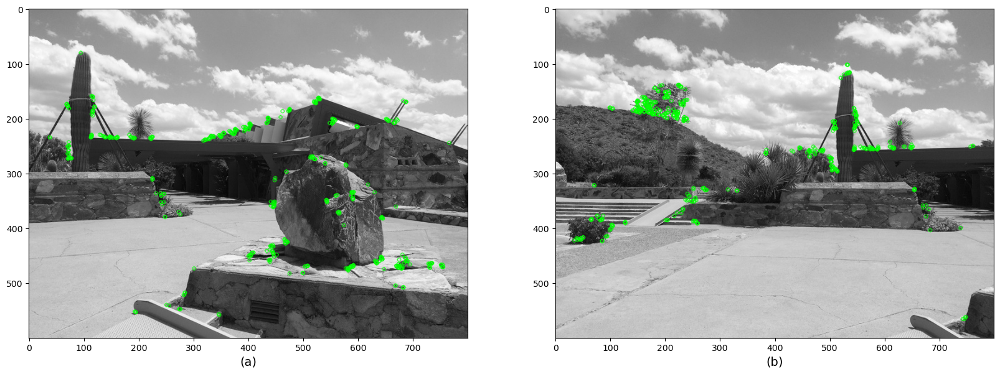

Using: bf feature matcher
Raw matches (Brute force): 134


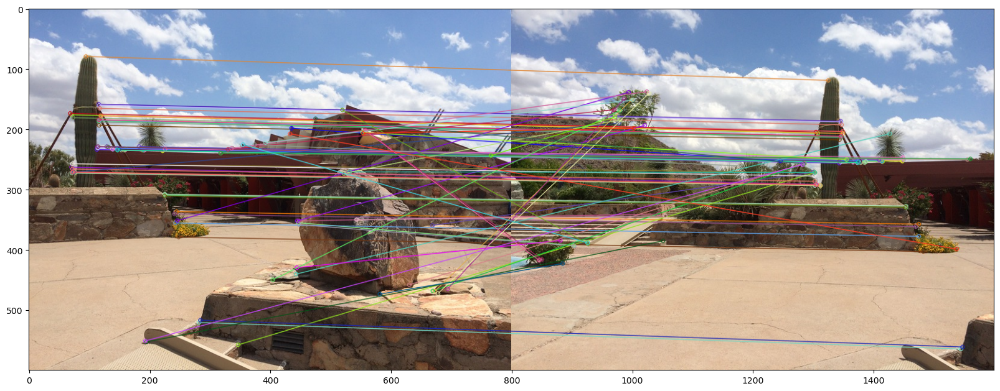

[[ 4.45097482e-01 -8.22890026e-02  4.53077539e+02]
 [-2.09176084e-01  7.94532958e-01  6.68986078e+01]
 [-6.29543668e-04 -1.61625222e-04  1.00000000e+00]]


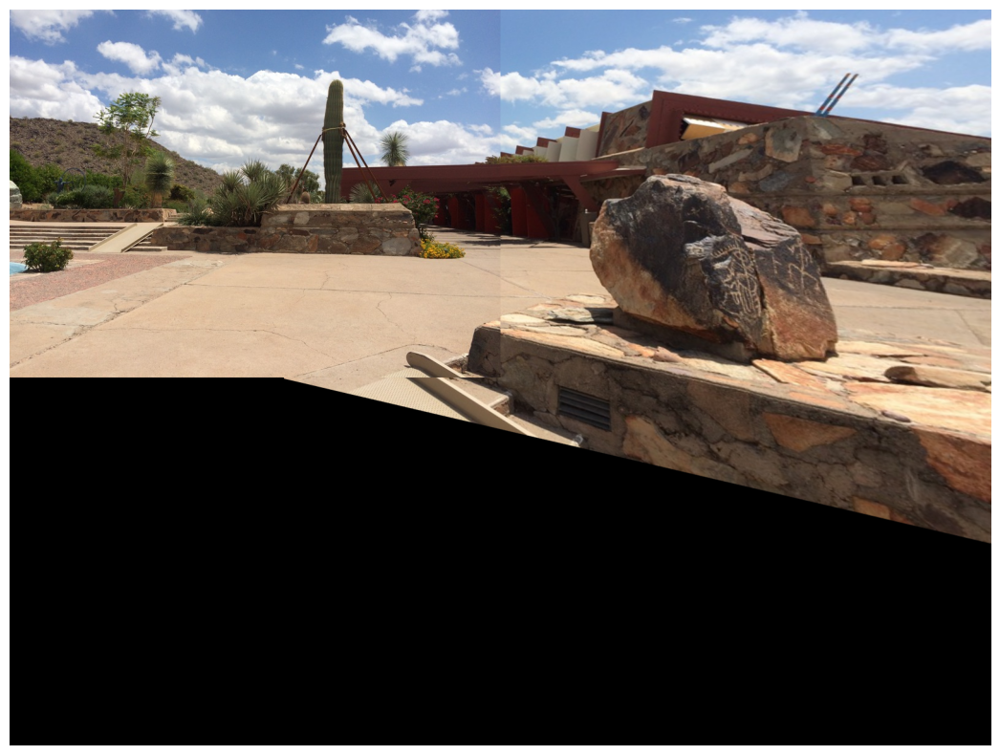

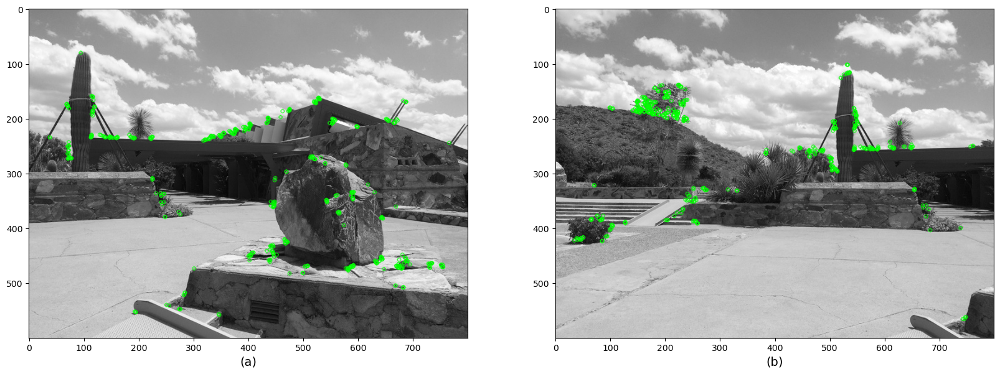

Using: knn feature matcher
Raw matches (knn): 500


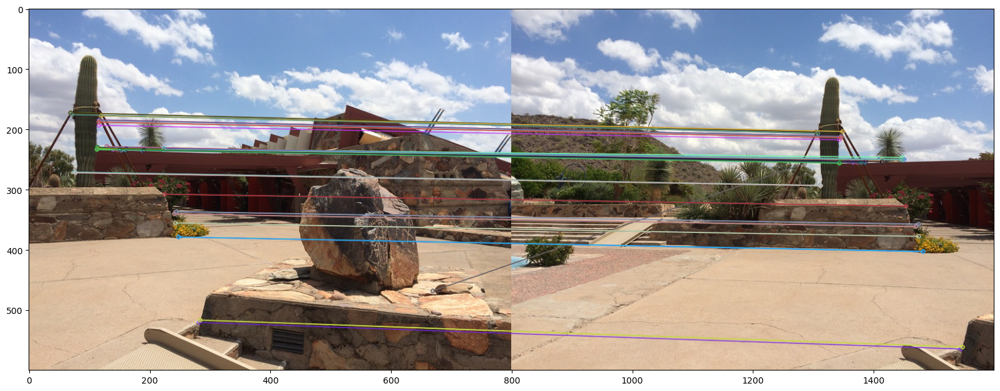

[[ 5.30050141e-01 -1.60242278e-01  4.54897253e+02]
 [-1.70145767e-01  7.50909082e-01  6.95162371e+01]
 [-4.80208405e-04 -2.83629757e-04  1.00000000e+00]]


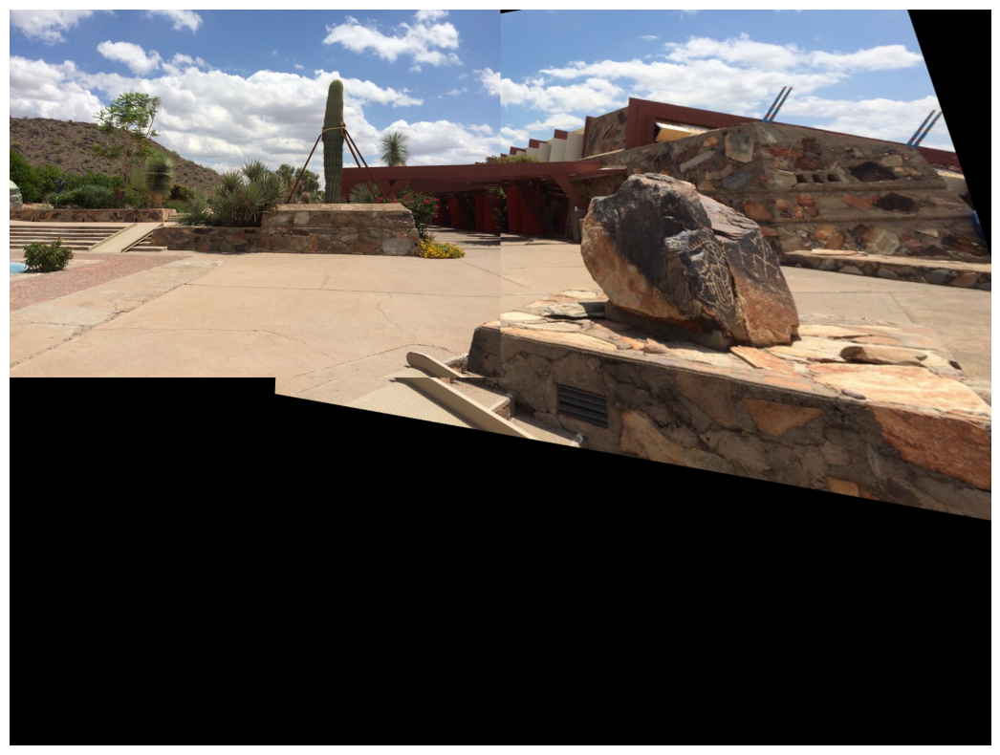

[ WARN:0@72.398] global shadow_sift.hpp:15 SIFT_create DEPRECATED: cv.xfeatures2d.SIFT_create() is deprecated due SIFT tranfer to the main repository. https://github.com/opencv/opencv/issues/16736


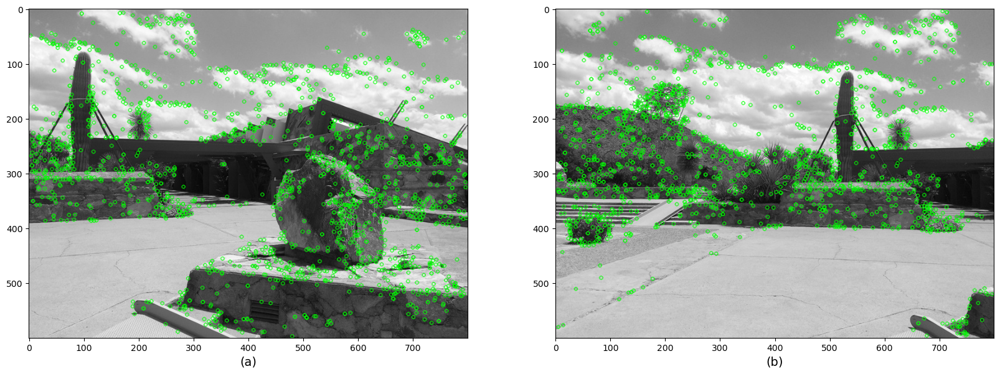

Using: bf feature matcher
Raw matches (Brute force): 605


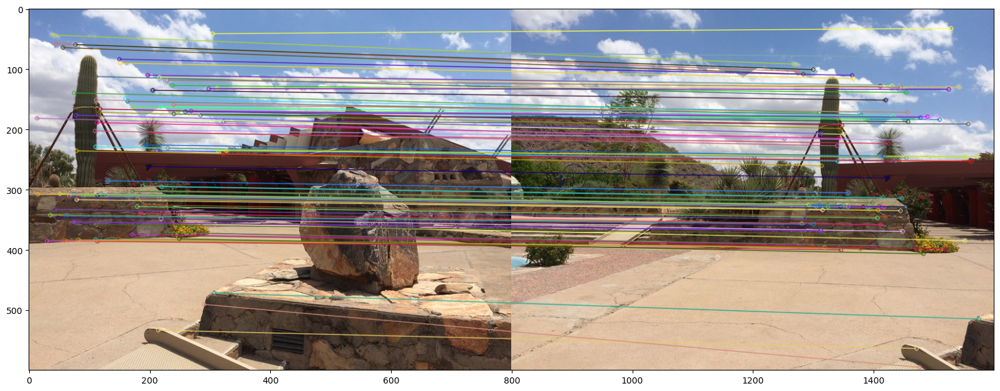

[[ 4.00389212e-01  3.24182356e-02  4.38937494e+02]
 [-2.36473546e-01  8.50351773e-01  6.20942004e+01]
 [-7.45917304e-04 -1.80401749e-05  1.00000000e+00]]


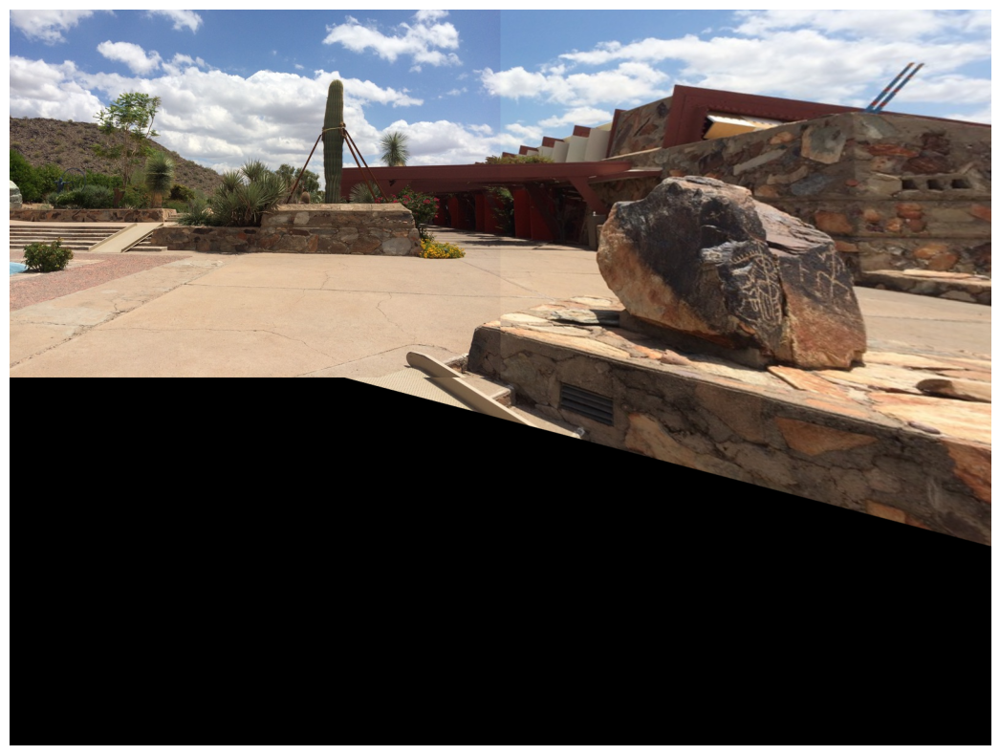

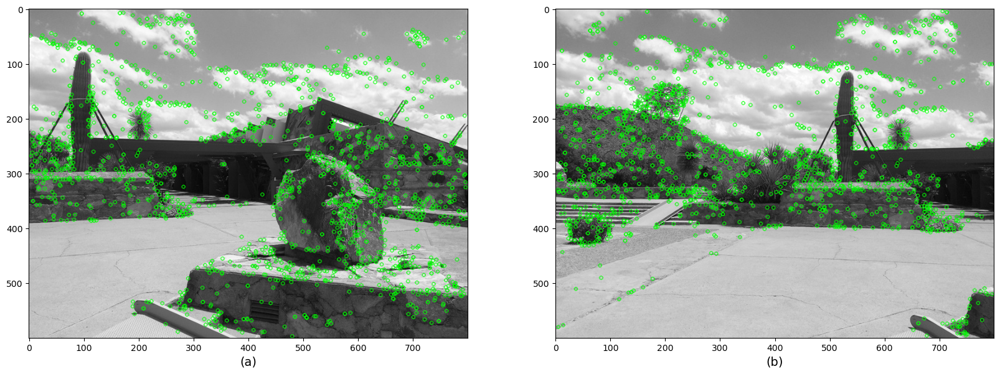

Using: knn feature matcher
Raw matches (knn): 1713


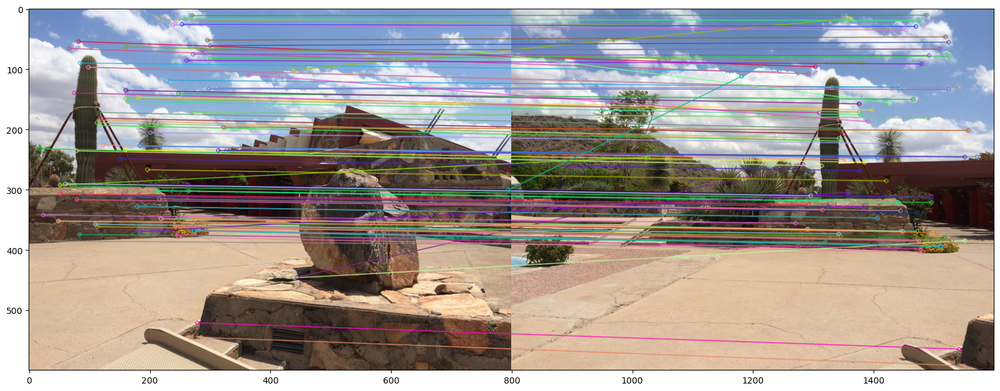

[[ 4.06858110e-01  3.00399597e-02  4.39197259e+02]
 [-2.33440426e-01  8.51157089e-01  6.14752921e+01]
 [-7.33968865e-04 -2.31823314e-05  1.00000000e+00]]


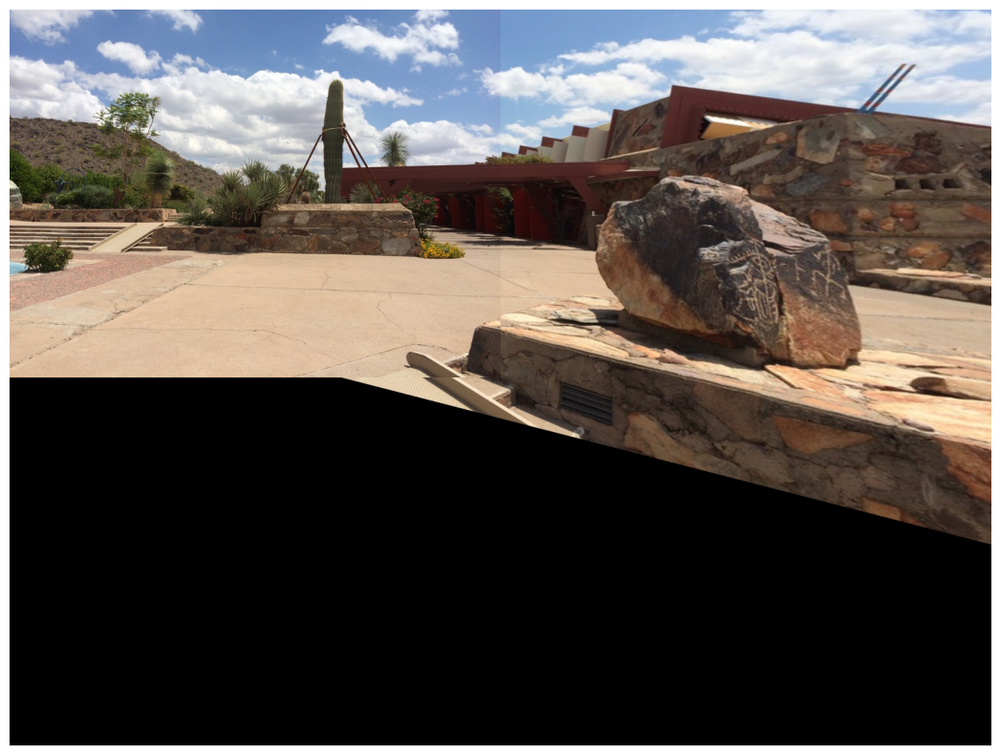

In [2]:
if __name__ == "__main__":
    
    
    
    image_directory = Path("./scottsdale")
    image_paths = list(image_directory.glob('*.jpg'))
    assert len(image_paths) >= 2, "Number of images should be greater than 1."
    show_input = False
    images = []
    gray_images = []
    for image_path in image_paths:
        image = cv2.imread(str(image_path))
        gray_images.append(cv2.cvtColor(image,cv2.COLOR_BGR2GRAY))
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        images.append(image)
        
        if show_input:
            plt.subplot(121)
            plt.imshow(image)
            plt.subplot(122)
            plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2GRAY),cmap='gray')
            plt.show()
            
    
    
    # display the keypoints and features detected on both images
    trainImg = images[0]
    queryImg = images[1]
    
    trainImg_gray = gray_images[0]
    queryImg_gray = gray_images[1]
    
    for feature_extractor in ['orb','sift']:
        for feature_matching in ['bf','knn']:
            kpsA, featuresA = features.detectAndDescribe(trainImg_gray, method=feature_extractor)
            kpsB, featuresB = features.detectAndDescribe(queryImg_gray, method=feature_extractor)
            fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,8), constrained_layout=False)
            ax1.imshow(cv2.drawKeypoints(trainImg_gray,kpsA,None,color=(0,255,0)))
            ax1.set_xlabel("(a)", fontsize=14)
            ax2.imshow(cv2.drawKeypoints(queryImg_gray,kpsB,None,color=(0,255,0)))
            ax2.set_xlabel("(b)", fontsize=14)
            plt.show()
            
            print("Using: {} feature matcher".format(feature_matching))

            fig = plt.figure(figsize=(20,8))

            if feature_matching == 'bf':
                matches = features.matchKeyPointsBF(featuresA, featuresB, method=feature_extractor)
                img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,matches[:100],
                                    None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            elif feature_matching == 'knn':
                matches = features.matchKeyPointsKNN(featuresA, featuresB, ratio=0.75, method=feature_extractor)
                img3 = cv2.drawMatches(trainImg,kpsA,queryImg,kpsB,np.random.choice(matches,100),
                                    None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
                

            plt.imshow(img3)
            plt.show()
                
            M = features.getHomography(kpsA, kpsB, featuresA, featuresB, matches, reprojThresh=4)
            assert M is not None, "Homography isn't found. Less matches?"
            (matches, H, status) = M
            print(H)
            
            # Apply panorama correction
            width = trainImg.shape[1] + queryImg.shape[1]
            height = trainImg.shape[0] + queryImg.shape[0]

            result = cv2.warpPerspective(trainImg, H, (width, height))
            result[0:queryImg.shape[0], 0:queryImg.shape[1]] = queryImg

            plt.figure(figsize=(20,10))
            plt.imshow(result)

            plt.axis('off')
            plt.show()
                